In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

In [3]:
df = pd.read_csv('C:/Users/User/Desktop/ВШЭ/Курсы/Годовой проект/Данные/expanded_data_with_OSM.csv', sep = ',')

К 19 ноября вам (вашей команде) необходимо провести разведочный анализ данных. 

Цель этого этапа – получить необходимую интуицию о данных и о задаче, с которыми вы работаете.

От вас требуется:

Изучить особенности данных:

Рассчитать основные статистики для вещественных и категориальных признаков (df.describe(include=’all’))

Есть ли пропущенные значения. Сколько. Какова их доля от общего числа объектов для каждого конкретного признака. И, в целом, насколько ваш датасет “разрежен” в контексте пропущенных значений. Выдвинуть и (желательно) проверить гипотезу, что могут означать пропущенные значения? Осмысленно и аргументированно обработать пропуски.

Есть ли ошибочные  (например, отрицательный возраст или пятиметровый рост человека; 3-й класс в задаче бинарной классификации) значения (признаки, целевая переменная) в данных. Обработать их.

Есть ли выбросы в данных? По возможности обработать их.

Изучить поведение каждого признака в отдельности, его связь с целевой переменной, а также попарные корреляции (в т.ч и в особенности с таргетом). Визуализировать попарные распределения признаков (sns.pairplot()) и корреляции наиболее значимых.

Построить подходящие сводные таблицы и прочие диаграммы.
Если проведённый вами анализ позволяет сделать какие-либо выводы, запишите их текстом максимально развернуто. Упомяните, как вы планируете задействовать приобретенные вами на этом этапе знания о вашей задаче.

Любые другие (не перечисленные выше) формы разведочного анализа данных и интересные формы визуализации данных открыто приветствуются. Также отметим, что диаграммы должны быть информативными, а выводы прозрачными.

Для нетабличных задач (CV, NLP) пункты 1-3 могут и будут выглядеть немного иначе: обратитесь к вашему куратору, чтобы узнать подробности.

Выполнение этого чекпойнта будет проверяться кураторами.

Разведочный анализ должен быть проведен в python, выводы запишите в отдельный файл EDA.txt. На гитхаб выложите и код, и файл с выводами.

Следующая контрольная точка будет 21 декабря – применение линейных моделей машинного обучения + промежуточная защита проекта.

In [29]:
df.head()

,id,atm_group,address,address_rus,lat,lng,test_train_flag,geometry,distance_to_fast_food,distance_to_clothes,...,distance_to_railway_station,distance_to_airport,distance_to_parking,distance_to_parking_underground,cnt_apart_200m,cnt_banks_200m,cnt_atm_200m,cities,regions,states
0,8526.0,32.0,"EMELYANOVA,34 Y-SAKHALINSK","улица А.О. Емельянова, 34, Южно-Сахалинск, Сах...",46.940995,142.738319,train,POINT (142.738319 46.940994999999994),1101.997929,815.369715,...,2888.292033,39774.216642,2892.577916,2346.129844,9,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast
1,8532.0,32.0,"KOMSOMOLSKAYA,259B Y.SAKHALINSK","Комсомольская улица, 259, Южно-Сахалинск, Саха...",46.937353,142.753348,train,POINT (142.75334799999996 46.937353),1177.665235,141.531360,...,3143.092355,40364.561477,2767.793411,2124.799118,17,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast
2,8533.0,32.0,"KOMMUN. PR., 32 YUZHNO SAKHAL","Коммунистический проспект, Южно-Сахалинск, Сах...",46.959413,142.741113,train,POINT (142.741113 46.959413),536.421857,1054.650591,...,1734.715409,36765.157465,1815.884777,1864.222802,4,1,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast
3,8684.0,32.0,"LENINGRADSKIY PR.,76A MOSCOW","Ленинградский проспект, 76А, Москва, Россия, 1...",55.805827,37.515146,train,POINT (37.515146 55.805827),10.006280,18.646221,...,111.400631,73227.945390,106.652808,471.901686,14,5,4,Moscow,Central Federal District,Moscow
4,37.0,32.0,"GVARDEYSKAYA PL., 2 NORILSK","Гвардейская площадь, 2, Норильск, Красноярский...",69.343541,88.211228,train,POINT (88.211228 69.343541),1264.514620,2159.536521,...,9329.940868,NaN,5763.343722,5842.299373,13,0,0,Norilsk,Siberian Federal District,Krasnoyarsk Krai


### Базовые статистики

In [5]:
df.describe(include='all').iloc[:,0:9]

,id,atm_group,address,address_rus,lat,lng,test_train_flag,geometry,distance_to_fast_food
count,8345.000000,8345.000000,8345,8345,8345.000000,8345.000000,8345,8345,7627.000000
unique,NaN,NaN,7126,6147,NaN,NaN,2,6147,NaN
top,NaN,NaN,"HOROSHEVSKOE SH,V38 MOSKVA","квартал В-13, городской округ Волгодонск, Рост...",NaN,NaN,train,POINT (42.207164000000006 47.54),NaN
freq,NaN,NaN,7,10,NaN,NaN,5957,10,NaN
mean,4412.909227,4405.440024,NaN,NaN,54.138304,63.500873,NaN,NaN,974.398453
std,2542.997777,2443.152067,NaN,NaN,4.329293,32.787366,NaN,NaN,1471.802539
min,1.000000,32.000000,NaN,NaN,42.057080,19.941530,NaN,NaN,0.000000
25%,2226.000000,1942.000000,NaN,NaN,52.243997,37.851107,NaN,NaN,160.864343
50%,4401.000000,5478.000000,NaN,NaN,55.060936,49.071694,NaN,NaN,451.854329
75%,6605.000000,5478.000000,NaN,NaN,56.116673,84.950218,NaN,NaN,1157.927365


In [6]:
df.describe(include='all').iloc[:,10:19]

,distance_to_vending_parking,distance_to_cafe,distance_to_pharmacy,distance_to_atm,distance_to_cinema,distance_to_shoe_shop,distance_to_bank,distance_to_supermarket,distance_to_restaurant
count,2006.000000,8039.000000,8020.000000,7876.000000,6665.000000,7181.000000,8126.000000,8019.000000,7532.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3114.097863,800.755020,588.162113,689.645493,2827.939577,1621.446897,713.978590,653.261863,1370.907192
std,2879.151832,1255.423507,988.169313,1215.363205,2312.088205,1840.099651,1185.605600,1058.264165,1684.049371
min,21.102462,0.000000,0.000000,0.000000,6.234851,0.000000,0.000000,0.000000,1.666452
25%,556.698057,150.445029,124.883215,60.074594,1011.066455,353.313879,86.493884,120.827341,285.711279
50%,2175.261180,376.765176,286.370488,265.316907,2209.389012,973.083097,304.943919,340.715767,762.892613
75%,5197.360775,900.759650,621.104264,755.077114,4103.949774,2179.676907,804.822747,723.095842,1718.330960


In [7]:
df.describe(include='all').iloc[:,20:29]

,distance_to_convenience,distance_to_vending_any,distance_to_bank_Сбербанк,distance_to_bank_ВТБ,distance_to_bank_Альфа-Банк,distance_to_bank_Росбанк,distance_to_atm_Сбербанк,distance_to_atm_ВТБ,distance_to_atm_Альфа-Банк
count,8134.000000,5425.000000,7588.000000,6353.000000,5248.000000,4200.000000,5967.000000,2712.000000,3098.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,632.681106,2834.225965,1238.331226,2492.635802,2785.338404,3589.917254,2944.411144,3935.168928,3418.433053
std,878.709983,2476.393920,1434.737900,2319.972343,2469.224365,2720.635840,2642.528094,2809.893322,2691.676396
min,0.000000,0.000000,2.785611,0.651168,3.948990,0.723947,0.571634,3.238792,0.000000
25%,198.534037,857.189146,394.475374,626.784129,818.914242,1329.262164,789.718805,1451.242567,1096.508521
50%,376.726937,2020.452641,780.579909,1814.718247,2035.740606,2889.746951,2044.408624,3560.518372,2800.173484
75%,716.483567,4230.691827,1491.280176,3743.184111,4181.924605,5528.849632,4617.103740,6097.635803,5407.422275


In [8]:
df.describe(include='all').iloc[:,30:39]

,distance_to_retail,distance_to_residential,distance_to_office,distance_to_commercial,distance_to_detached,distance_to_train_station,distance_to_apartments,distance_to_house,distance_to_railway_halt
count,7910.000000,7659.000000,7033.000000,7868.000000,6963.000000,6324.000000,8155.000000,8124.000000,8012.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,807.417556,2264.217033,1797.270589,1107.591982,2793.574959,3848.080646,349.815935,1567.059271,9799.029919
std,1225.336322,1997.788132,1942.446444,1442.307482,2318.878926,2580.272652,779.290727,1453.750609,13984.069026
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,83.102492
25%,136.541649,800.030399,475.277513,267.283598,965.706025,1725.545701,34.379899,569.400085,2988.105289
50%,407.879113,1648.994008,1097.172563,626.459986,2137.670627,3405.766450,135.677210,1121.033966,5351.530322
75%,936.503317,3137.062238,2356.607389,1326.088212,4027.138724,5670.682548,337.328264,2086.590586,9547.289969


In [9]:
df.describe(include='all').iloc[:,40:50]

,distance_to_bus_stop,distance_to_railway_station,distance_to_airport,distance_to_parking,distance_to_parking_underground,cnt_apart_200m,cnt_banks_200m,cnt_atm_200m,cities,regions
count,8318.000000,8079.000000,5334.000000,7460.000000,3446.000000,8345.000000,8345.000000,8345.000000,8345,8343
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1003,8
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Moscow,Central Federal District
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,796,2366
mean,930.733563,5424.075745,43553.315011,1759.262574,3509.705348,5.905692,0.968844,1.278490,NaN,NaN
std,4154.627499,9357.217337,22622.849328,1885.221998,2525.030531,6.340366,1.507090,2.262835,NaN,NaN
min,11.069262,6.541512,2180.203415,25.136211,6.818753,0.000000,0.000000,0.000000,NaN,NaN
25%,135.101977,1385.158133,26001.147979,515.252329,1443.623461,0.000000,0.000000,0.000000,NaN,NaN
50%,232.682559,3087.724479,40171.775177,1132.012590,2914.218594,4.000000,0.000000,0.000000,NaN,NaN
75%,412.110902,5753.401089,61059.686640,2229.316664,5122.183412,10.000000,1.000000,2.000000,NaN,NaN


Выбросов нет, потому что почти все признаки это расстояния от банкомата до какого-либо объекта в пределах заданного диаметра

### Пропуски

In [11]:
#количество заполненых значений
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8345 entries, 0 to 8344
Data columns (total 51 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               8345 non-null   float64
 1   atm_group                        8345 non-null   float64
 2   address                          8345 non-null   object 
 3   address_rus                      8345 non-null   object 
 4   lat                              8345 non-null   float64
 5   lng                              8345 non-null   float64
 6   test_train_flag                  8345 non-null   object 
 7   geometry                         8345 non-null   object 
 8   distance_to_fast_food            7627 non-null   float64
 9   distance_to_clothes              7656 non-null   float64
 10  distance_to_vending_parking      2006 non-null   float64
 11  distance_to_cafe                 8039 non-null   float64
 12  distance_to_pharmacy

Начиная с 8 по 44 признак есть пропуски. Т. к. эти признаки - это расстояние от банкомата до какого-то объекта, пропуск означает, что в заданном радиусе нет данного объекта. Возможно пропуски можно заменить на максимумы.

Также есть 2 пропуска в столбце regions

In [12]:
df.loc[[5376,7623]][['regions', 'states','cities']]

,regions,states,cities
5376,NaN,Republic of Crimea,Зелёновское сельское поселение
7623,NaN,Autonomous Republic of Crimea,Feodosia


In [13]:
#два пропущенных региона - это южный федеральный округ
df['regions'] = df['regions'].replace(np.nan, 'Southern Federal District')

Осмысленно и аргументированно обработать пропуски.
#обработать расстояния

### Добавляю таргет 

In [14]:
df2 = pd.read_csv('C:/Users/User/Desktop/ВШЭ/Курсы/Годовой проект/Данные/train.csv')

In [15]:
df_train = df.merge(df2[['id','target']], left_on = 'id', right_on = 'id')

In [16]:
df_train.head()

,id,atm_group,address,address_rus,lat,lng,test_train_flag,geometry,distance_to_fast_food,distance_to_clothes,...,distance_to_airport,distance_to_parking,distance_to_parking_underground,cnt_apart_200m,cnt_banks_200m,cnt_atm_200m,cities,regions,states,target
0,8526.0,32.0,"EMELYANOVA,34 Y-SAKHALINSK","улица А.О. Емельянова, 34, Южно-Сахалинск, Сах...",46.940995,142.738319,train,POINT (142.738319 46.940994999999994),1101.997929,815.369715,...,39774.216642,2892.577916,2346.129844,9,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.011500
1,8532.0,32.0,"KOMSOMOLSKAYA,259B Y.SAKHALINSK","Комсомольская улица, 259, Южно-Сахалинск, Саха...",46.937353,142.753348,train,POINT (142.75334799999996 46.937353),1177.665235,141.531360,...,40364.561477,2767.793411,2124.799118,17,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.029710
2,8533.0,32.0,"KOMMUN. PR., 32 YUZHNO SAKHAL","Коммунистический проспект, Южно-Сахалинск, Сах...",46.959413,142.741113,train,POINT (142.741113 46.959413),536.421857,1054.650591,...,36765.157465,1815.884777,1864.222802,4,1,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.009540
3,8684.0,32.0,"LENINGRADSKIY PR.,76A MOSCOW","Ленинградский проспект, 76А, Москва, Россия, 1...",55.805827,37.515146,train,POINT (37.515146 55.805827),10.006280,18.646221,...,73227.945390,106.652808,471.901686,14,5,4,Moscow,Central Federal District,Moscow,-0.094035
4,37.0,32.0,"GVARDEYSKAYA PL., 2 NORILSK","Гвардейская площадь, 2, Норильск, Красноярский...",69.343541,88.211228,train,POINT (88.211228 69.343541),1264.514620,2159.536521,...,NaN,5763.343722,5842.299373,13,0,0,Norilsk,Siberian Federal District,Krasnoyarsk Krai,0.079277


Меняю знак у фичей, в которых рассчитаны расстояния от банкоматов до объектов

In [17]:
for column in df_train.columns:
    if column[0:8]=='distance':
        df_train[column]= df_train[column]*-1

In [18]:
df_train.head()

,id,atm_group,address,address_rus,lat,lng,test_train_flag,geometry,distance_to_fast_food,distance_to_clothes,...,distance_to_airport,distance_to_parking,distance_to_parking_underground,cnt_apart_200m,cnt_banks_200m,cnt_atm_200m,cities,regions,states,target
0,8526.0,32.0,"EMELYANOVA,34 Y-SAKHALINSK","улица А.О. Емельянова, 34, Южно-Сахалинск, Сах...",46.940995,142.738319,train,POINT (142.738319 46.940994999999994),-1101.997929,-815.369715,...,-39774.216642,-2892.577916,-2346.129844,9,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.011500
1,8532.0,32.0,"KOMSOMOLSKAYA,259B Y.SAKHALINSK","Комсомольская улица, 259, Южно-Сахалинск, Саха...",46.937353,142.753348,train,POINT (142.75334799999996 46.937353),-1177.665235,-141.531360,...,-40364.561477,-2767.793411,-2124.799118,17,0,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.029710
2,8533.0,32.0,"KOMMUN. PR., 32 YUZHNO SAKHAL","Коммунистический проспект, Южно-Сахалинск, Сах...",46.959413,142.741113,train,POINT (142.741113 46.959413),-536.421857,-1054.650591,...,-36765.157465,-1815.884777,-1864.222802,4,1,0,Yuzhno-Sakhalinsk,Far Eastern Federal District,Sakhalin Oblast,0.009540
3,8684.0,32.0,"LENINGRADSKIY PR.,76A MOSCOW","Ленинградский проспект, 76А, Москва, Россия, 1...",55.805827,37.515146,train,POINT (37.515146 55.805827),-10.006280,-18.646221,...,-73227.945390,-106.652808,-471.901686,14,5,4,Moscow,Central Federal District,Moscow,-0.094035
4,37.0,32.0,"GVARDEYSKAYA PL., 2 NORILSK","Гвардейская площадь, 2, Норильск, Красноярский...",69.343541,88.211228,train,POINT (88.211228 69.343541),-1264.514620,-2159.536521,...,NaN,-5763.343722,-5842.299373,13,0,0,Norilsk,Siberian Federal District,Krasnoyarsk Krai,0.079277


### sns.pairplot для определения кореляций между признаками и таргетом

In [19]:
df_train.columns

Index(['id', 'atm_group', 'address', 'address_rus', 'lat', 'lng',
       'test_train_flag', 'geometry', 'distance_to_fast_food',
       'distance_to_clothes', 'distance_to_vending_parking',
       'distance_to_cafe', 'distance_to_pharmacy', 'distance_to_atm',
       'distance_to_cinema', 'distance_to_shoe_shop', 'distance_to_bank',
       'distance_to_supermarket', 'distance_to_restaurant',
       'distance_to_mobile_phone_shop', 'distance_to_convenience',
       'distance_to_vending_any', 'distance_to_bank_Сбербанк',
       'distance_to_bank_ВТБ', 'distance_to_bank_Альфа-Банк',
       'distance_to_bank_Росбанк', 'distance_to_atm_Сбербанк',
       'distance_to_atm_ВТБ', 'distance_to_atm_Альфа-Банк',
       'distance_to_atm_Росбанк', 'distance_to_retail',
       'distance_to_residential', 'distance_to_office',
       'distance_to_commercial', 'distance_to_detached',
       'distance_to_train_station', 'distance_to_apartments',
       'distance_to_house', 'distance_to_railway_halt',
    

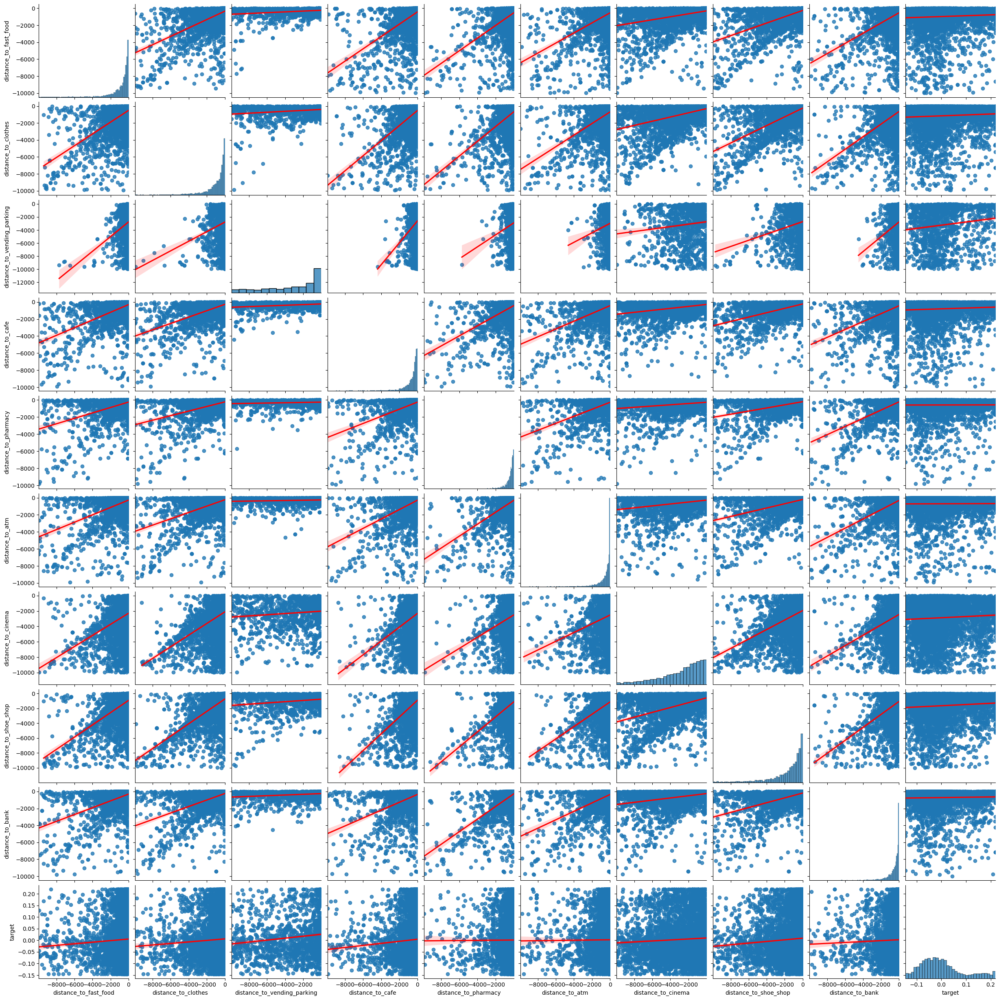

In [20]:
sns.pairplot(df_train[['distance_to_fast_food',
                       'distance_to_clothes', 'distance_to_vending_parking',
                       'distance_to_cafe', 'distance_to_pharmacy', 'distance_to_atm',
                       'distance_to_cinema', 'distance_to_shoe_shop', 'distance_to_bank', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

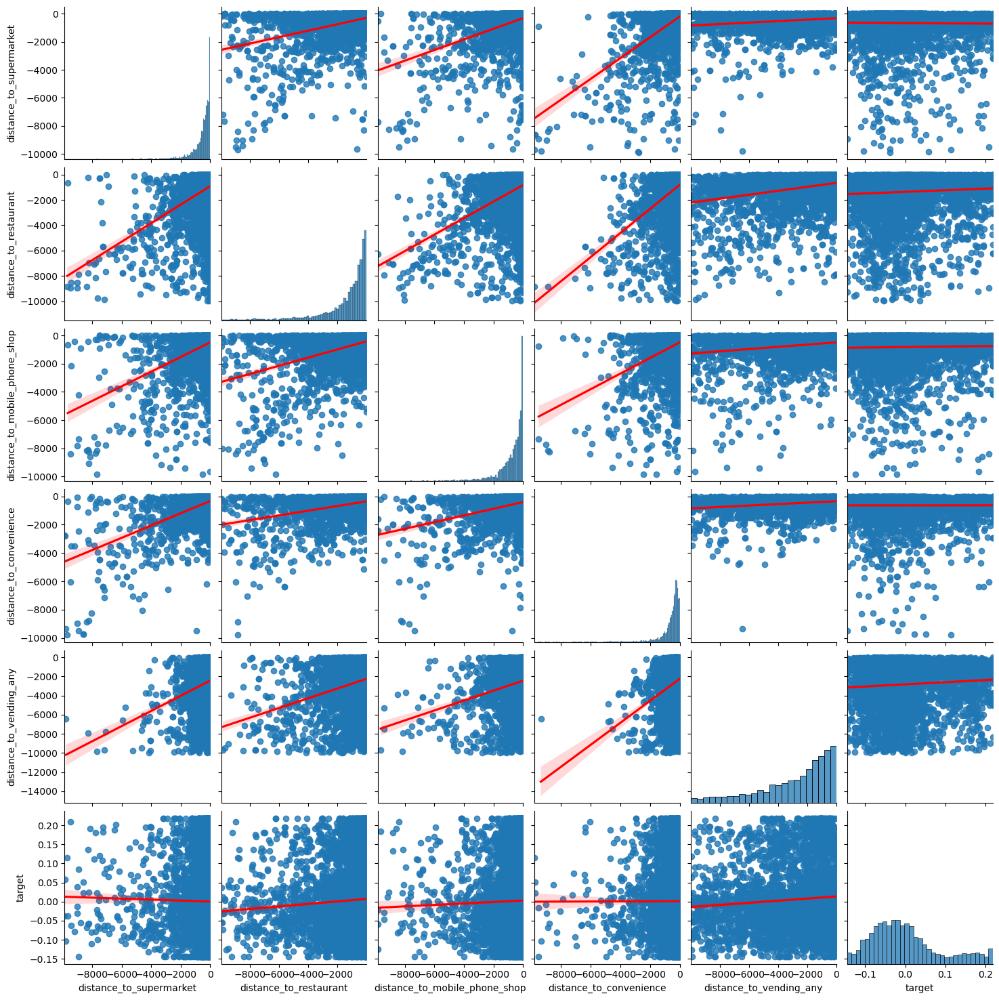

In [21]:
sns.pairplot(df_train[['distance_to_supermarket', 'distance_to_restaurant',
       'distance_to_mobile_phone_shop', 'distance_to_convenience',
       'distance_to_vending_any', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

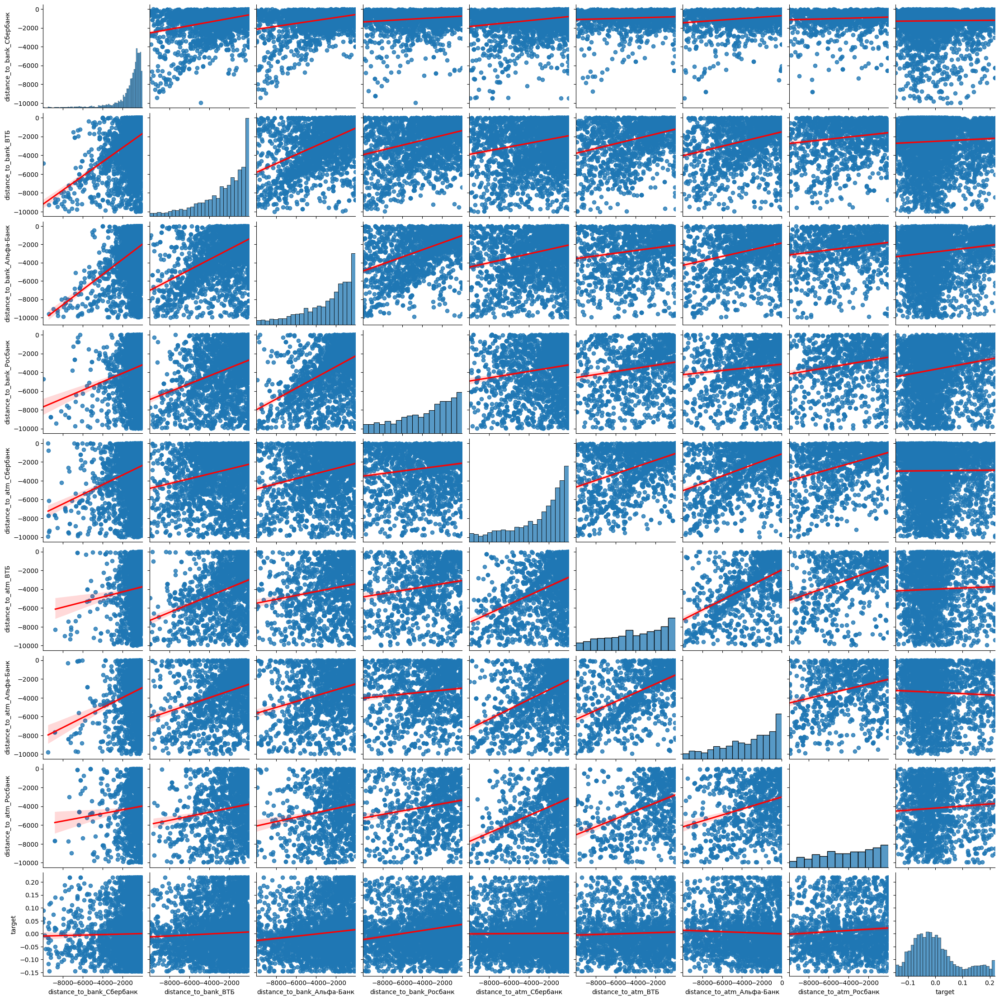

In [26]:
sns.pairplot(df_train[['distance_to_bank_Сбербанк',
       'distance_to_bank_ВТБ', 'distance_to_bank_Альфа-Банк',
       'distance_to_bank_Росбанк', 'distance_to_atm_Сбербанк',
       'distance_to_atm_ВТБ', 'distance_to_atm_Альфа-Банк',
       'distance_to_atm_Росбанк', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

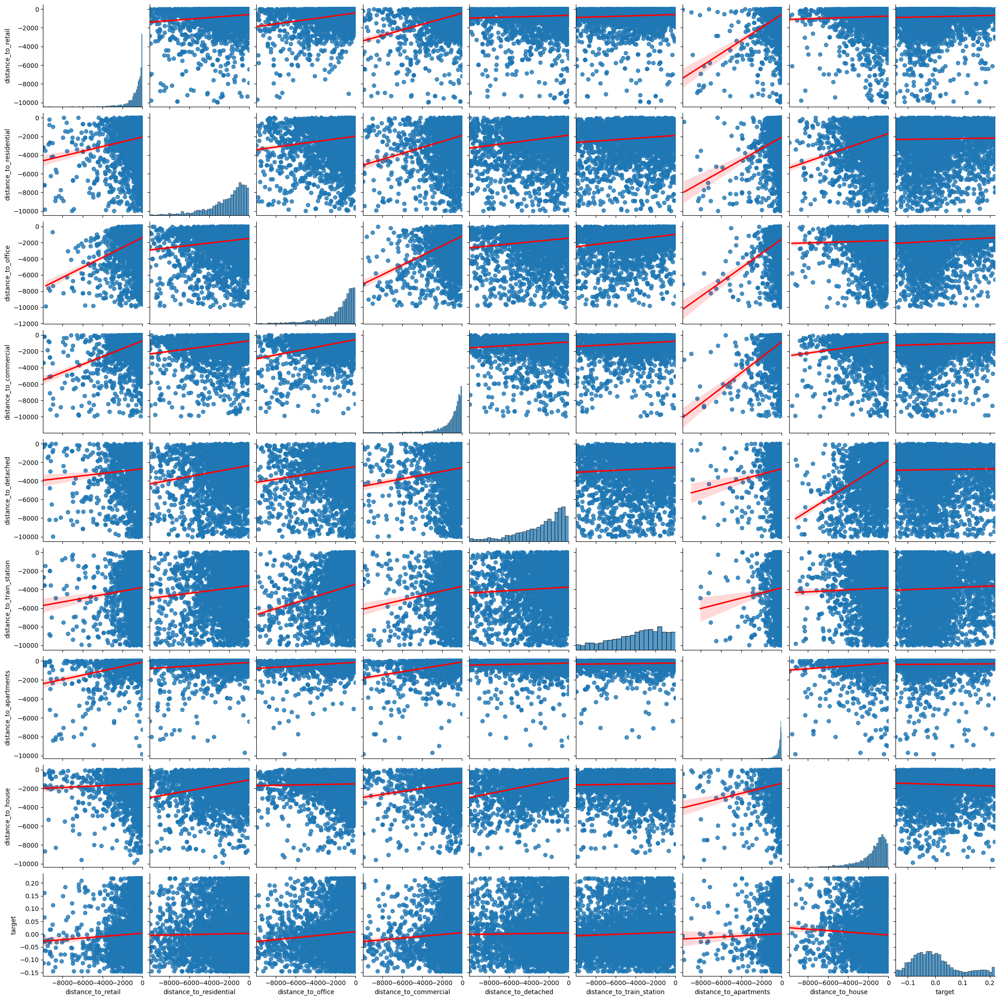

In [23]:
sns.pairplot(df_train[['distance_to_retail',
       'distance_to_residential', 'distance_to_office',
       'distance_to_commercial', 'distance_to_detached',
       'distance_to_train_station', 'distance_to_apartments',
       'distance_to_house', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

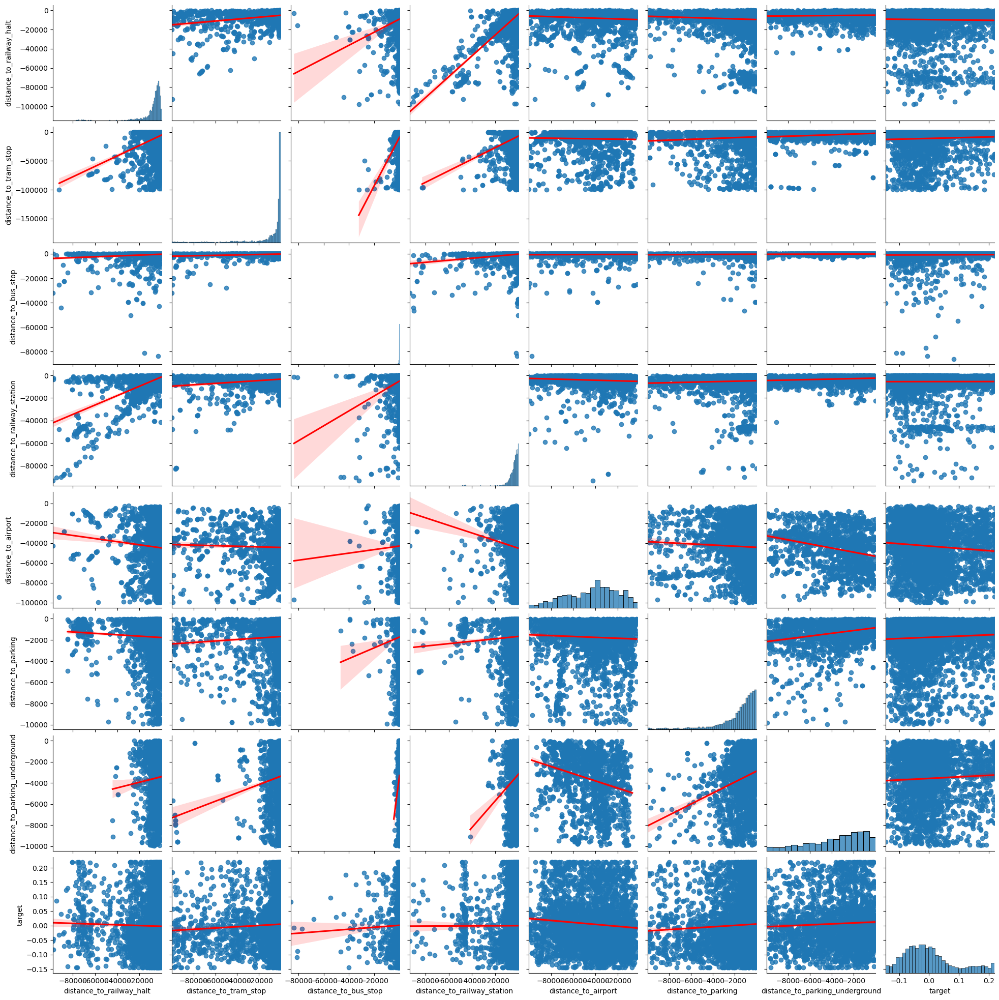

In [24]:
sns.pairplot(df_train[['distance_to_railway_halt',
       'distance_to_tram_stop', 'distance_to_bus_stop',
       'distance_to_railway_station', 'distance_to_airport',
       'distance_to_parking', 'distance_to_parking_underground', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

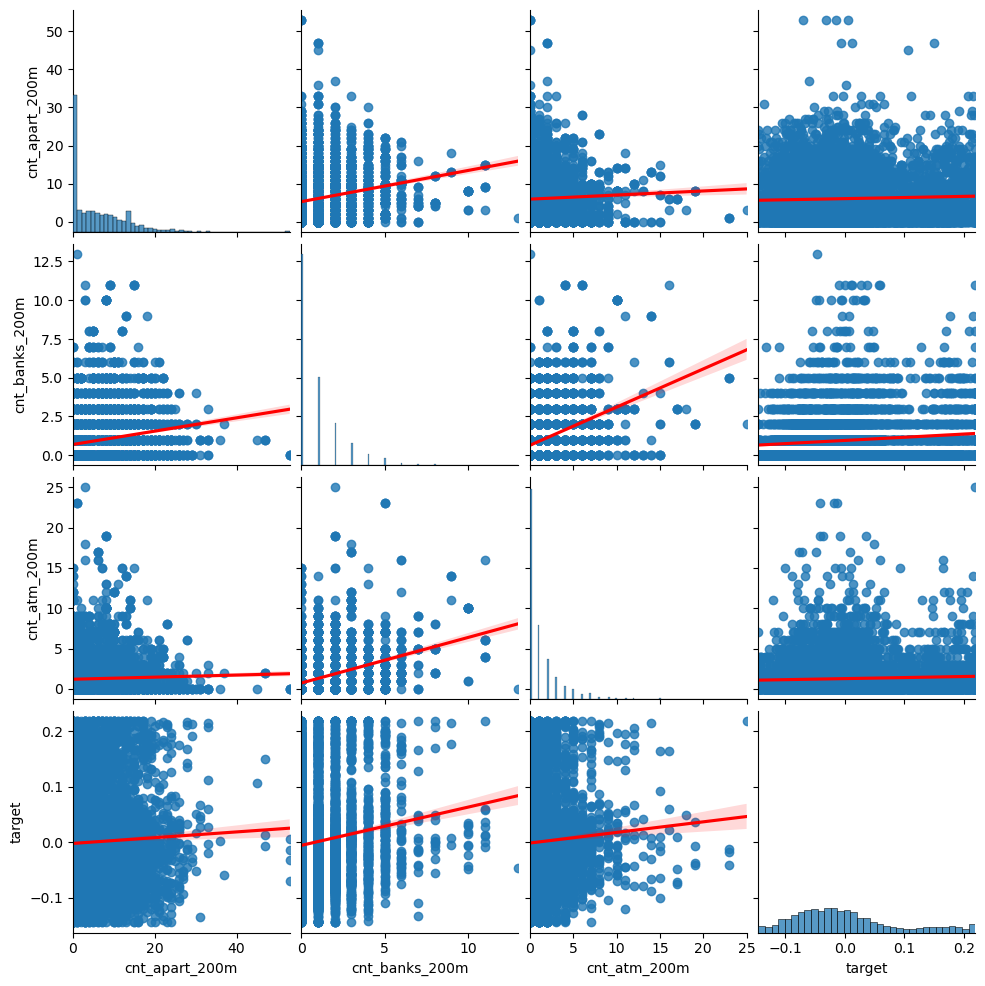

In [25]:
sns.pairplot(df_train[['cnt_apart_200m', 'cnt_banks_200m', 'cnt_atm_200m', 'cities', 'regions',
       'states', 'target']], kind = 'reg', plot_kws={'line_kws':{'color':'red'}})

Нет смысла смотреть на зависимость признаков между собой, так как рассчитывалась дистанция до ближайшего объекта. Если посмотреть на гистограммы признаков, то видно что данные скучены ближе к началу координат (к концу координат из-за изменение знака на -)

Признаки с наибольшей кореляцией с таргетом:

distance_to_vending_parking, distance_to_atm_Росбанк,distance_to_vending_any,
distance_to_bank_ВТБ, distance_to_bank_Альфа-Банк,distance_to_bank_Росбанк

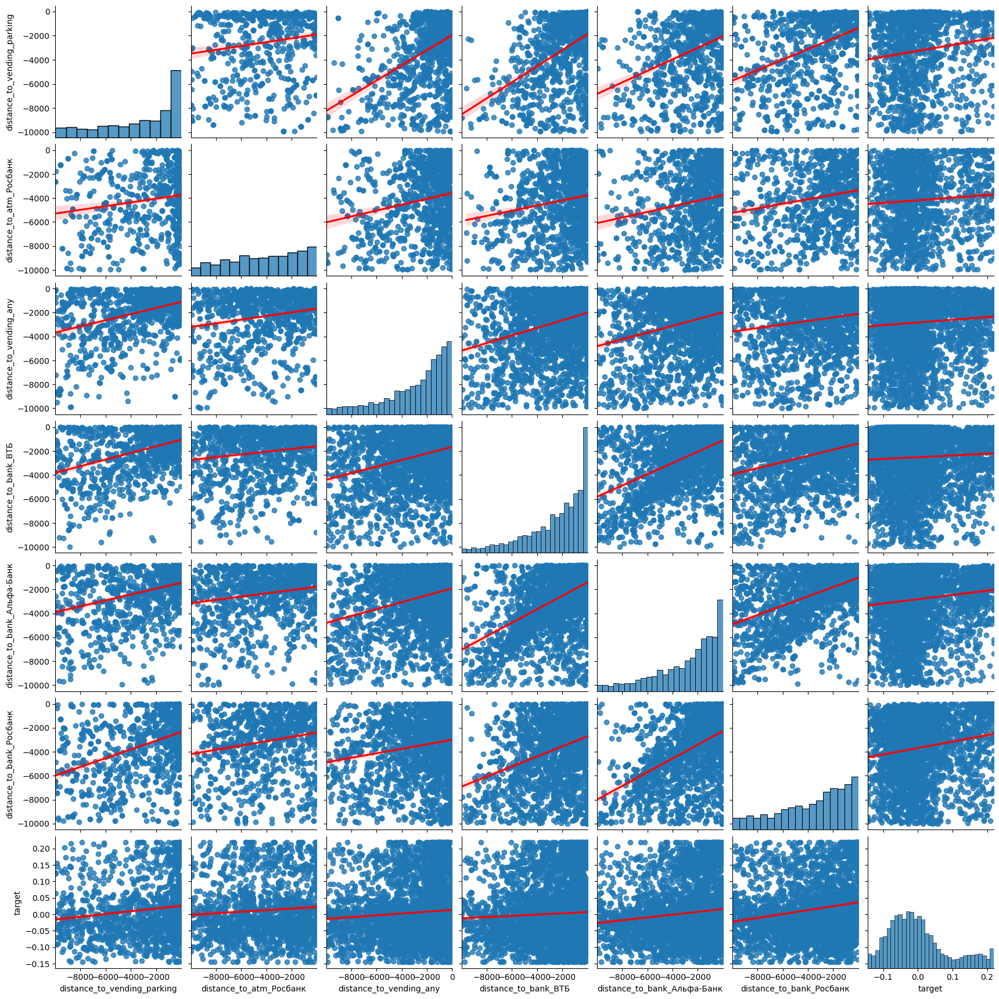

In [31]:
sns.pairplot(df_train[['distance_to_vending_parking', 'distance_to_atm_Росбанк','distance_to_vending_any', 
                       'distance_to_bank_ВТБ', 'distance_to_bank_Альфа-Банк','distance_to_bank_Росбанк','target']], 
             kind = 'reg', plot_kws={'line_kws':{'color':'red'}})